# Fourier Transform

In [14]:
# Consolidated imports (moved to top)
import os
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import pandas as pd

# FFT utilities
from numpy.fft import fft2, ifft2, fftshift, ifftshift

# Image processing
from skimage import io, color, exposure, util, feature, filters, measure, morphology
from skimage.feature import hog
from skimage.filters import sobel, sobel_h, sobel_v
from skimage.transform import resize

# I/O
import imageio.v3 as iio
from PIL import Image

# Utilities
from tabulate import tabulate
from math import pi

# Notebook display preferences (uncomment if using in interactive notebook)
# %matplotlib inline


1. Load a grayscale image and apply the 2D Discrete Fourier Transform (DFT) to it. Visualize
the original image and its frequency spectrum (magnitude). Submit the images, and
explanation.

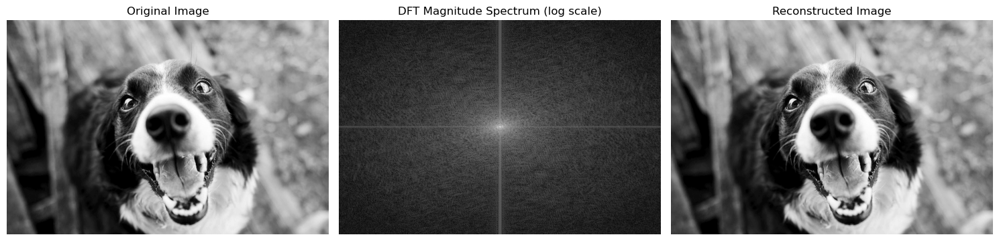

In [15]:
# -------- Plot --------
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

def imread_grayscale(path):
    return np.asarray(Image.open(path).convert("L"), dtype=np.float32) / 255.0

img = imread_grayscale("img/grayscale/img1.png")
dft = fft2(img)
dft_shifted = fftshift(dft)
magnitude_spectrum = np.abs(dft_shifted)
magnitude_log = np.log1p(magnitude_spectrum)
img_reconstructed = np.abs(ifft2(ifftshift(dft_shifted)))

axes[0].imshow(img, cmap='gray')
axes[0].set_title("Original Image")
axes[0].axis('off')

axes[1].imshow(magnitude_log, cmap='gray')
axes[1].set_title("DFT Magnitude Spectrum (log scale)")
axes[1].axis('off')

axes[2].imshow(img_reconstructed, cmap='gray')
axes[2].set_title("Reconstructed Image")
axes[2].axis('off')

plt.tight_layout()

# -------- Save BEFORE show --------
outdir = Path("results/dft")
outdir.mkdir(parents=True, exist_ok=True)
fig.savefig(outdir / "dft.png", dpi=300, bbox_inches="tight")

plt.show()
plt.close(fig)

2. Implement a low-pass filter in the frequency domain to remove high-frequency noise from
an image. Compare the filtered image with the original image. Submit images, and analysis
of the results.

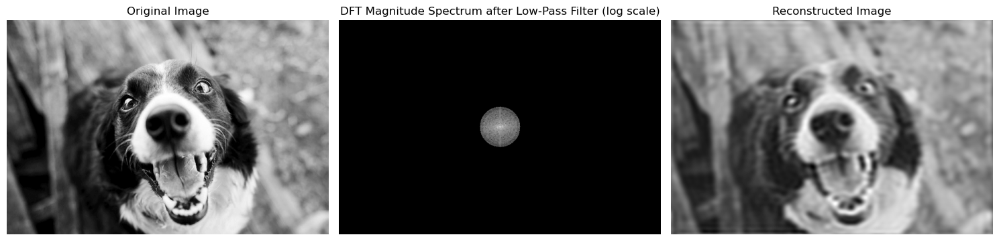

In [16]:
# -------- Load & prep image --------
img = iio.imread("img/grayscale/img1.png")
if img.ndim == 3:
    img = np.dot(img[..., :3], [0.299, 0.587, 0.114])

img = img.astype(float)
img = (img - img.min()) / (img.max() - img.min() + 1e-8)

# -------- DFT --------
F = fft2(img)
Fshift = fftshift(F)

# -------- Low-pass mask (soft) --------
M, N = img.shape
cy, cx = M // 2, N // 2
Y, X = np.ogrid[:M, :N]

radius = int(0.08 * min(M, N))        # inner radius
mask_hard = ((X - cx)**2 + (Y - cy)**2 <= radius**2).astype(float)  # 1 inside, 0 outside

r2 = max(radius + 6, radius + radius // 6)  # outer radius for soft edge
mask_soft = ((X - cx)**2 + (Y - cy)**2 <= r2**2).astype(float)

# Blend to get a soft low-pass between radii (simple two-level blend)
H = 0.5 * mask_hard + 0.5 * mask_soft  # values in [0,1], higher near the center

# Apply filter in frequency domain
Gshift = Fshift * H

# -------- Reconstruct --------
g = np.real(ifft2(ifftshift(Gshift)))
g = (g - g.min()) / (g.max() - g.min() + 1e-12)

# -------- Spectrum for display --------
spec_log = np.log1p(np.abs(Gshift))
spec_log = (spec_log - spec_log.min()) / (spec_log.max() - spec_log.min() + 1e-12)

# -------- Plot --------
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(img, cmap='gray')
axes[0].set_title("Original Image")
axes[0].axis('off')

axes[1].imshow(spec_log, cmap='gray')
axes[1].set_title("DFT Magnitude Spectrum after Low-Pass Filter (log scale)")
axes[1].axis('off')

axes[2].imshow(g, cmap='gray')
axes[2].set_title("Reconstructed Image")
axes[2].axis('off')

plt.tight_layout()

# -------- Save BEFORE show --------
outdir = Path("results/dft")
outdir.mkdir(parents=True, exist_ok=True)
fig.savefig(outdir / "lpf.png", dpi=300, bbox_inches="tight")

plt.show()
plt.close(fig)

3. Implement a high-pass filter to enhance the edges in an image. Visualize the filtered image
and discuss the effects observed. Submit images, and explanation.

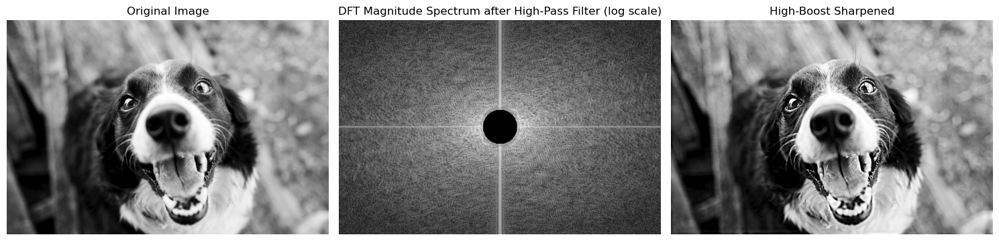

In [17]:
# -------- Load image --------
img = iio.imread("img/grayscale/img1.png")
if img.ndim == 3:
    img = np.dot(img[..., :3], [0.299, 0.587, 0.114])

# Normalize to [0,1]
img = img.astype(float)
img = (img - img.min()) / (img.max() - img.min() + 1e-8)

# -------- DFT --------
F = fft2(img)
Fshift = fftshift(F)

# -------- High-pass (via 1 - soft low-pass) --------
M, N = img.shape
cy, cx = M // 2, N // 2
Y, X = np.ogrid[:M, :N]
radius = int(0.08 * min(M, N))
lp_core = ((X - cx)**2 + (Y - cy)**2 <= radius**2).astype(float)
r2 = max(radius + 6, radius + radius//6)
lp_soft = ((X - cx)**2 + (Y - cy)**2 <= r2**2).astype(float)
H_lp = 0.5*lp_core + 0.5*lp_soft
H_hp = 1.0 - H_lp

# Apply HP in frequency domain
Gshift = Fshift * H_hp

# Inverse DFT (edge component)
g_hp = np.real(ifft2(ifftshift(Gshift)))

# High-boost sharpening
alpha = 0.6
sharp = img + alpha * (g_hp - g_hp.mean())
sharp = np.clip(sharp, 0, 1)

# Spectrum for display (log, normalized)
spec_log = np.log1p(np.abs(Gshift))
spec_log = (spec_log - spec_log.min()) / (spec_log.max() - spec_log.min() + 1e-12)

# -------- Plot --------
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(img, cmap='gray')
axes[0].set_title("Original Image")
axes[0].axis('off')

axes[1].imshow(spec_log, cmap='gray')
axes[1].set_title("DFT Magnitude Spectrum after High-Pass Filter (log scale)")
axes[1].axis('off')

axes[2].imshow(sharp, cmap='gray')
axes[2].set_title("High-Boost Sharpened")
axes[2].axis('off')

plt.tight_layout()

# -------- Save BEFORE show --------
outdir = Path("results/dft")
outdir.mkdir(parents=True, exist_ok=True)
fig.savefig(outdir / "hpf.png", dpi=300, bbox_inches="tight")

plt.show()
plt.close(fig)

4. Implement an image compression technique using Fourier Transform by selectively keeping
only a certain percentage of the Fourier coefficients. Evaluate the quality of the
reconstructed image as you vary the percentage of coefficients used. Submit the images,
and your observations on image quality and compression ratio.

In [18]:
def mse(x, y):
    """
    Mean Squared Error between two images."""
    x = x.astype(np.float64)
    y = y.astype(np.float64)
    return np.mean((x - y) ** 2)

def psnr(x, y):
    """
    PSNR for images in [0,1].
    """
    m = mse(x, y)
    if m <= 1e-12:  # identical
        return 99.0
    return 10 * np.log10(1.0 / m)

def _gaussian_kernel_1d(size=11, sigma=1.5):
    """
    1D Gaussian kernel.
    """
    ax = np.arange(-(size//2), size//2 + 1, dtype=np.float64)
    g = np.exp(-(ax**2) / (2 * sigma**2))
    g /= g.sum()
    return g

def _conv2_separable(img, k):
    """
    2D separabel konvolusjon med 1D-kjerne k, reflect-padding.
    """
    pad = len(k) // 2
    # radvis
    tmp = np.pad(img, ((0, 0), (pad, pad)), mode='reflect')
    tmp = np.apply_along_axis(lambda m: np.convolve(m, k, mode='valid'), axis=1, arr=tmp)
    # kolonnevis
    tmp = np.pad(tmp, ((pad, pad), (0, 0)), mode='reflect')
    out = np.apply_along_axis(lambda m: np.convolve(m, k, mode='valid'), axis=0, arr=tmp)
    return out

def ssim(x, y, size=11, sigma=1.5):
    """
    SSSIM for images in [0,1].
    """
    x = x.astype(np.float64)
    y = y.astype(np.float64)

    k = _gaussian_kernel_1d(size=size, sigma=sigma)

    mu_x = _conv2_separable(x, k)
    mu_y = _conv2_separable(y, k)

    mu_x2 = mu_x * mu_x
    mu_y2 = mu_y * mu_y
    mu_xy = mu_x * mu_y

    sigma_x2 = _conv2_separable(x * x, k) - mu_x2
    sigma_y2 = _conv2_separable(y * y, k) - mu_y2
    sigma_xy = _conv2_separable(x * y, k) - mu_xy

    # L = 1 (bilder er normalisert), standardkonstanter
    C1 = (0.01 ** 2)
    C2 = (0.03 ** 2)

    num = (2 * mu_xy + C1) * (2 * sigma_xy + C2)
    den = (mu_x2 + mu_y2 + C1) * (sigma_x2 + sigma_y2 + C2)
    ssim_map = num / (den + 1e-12)
    return float(np.mean(ssim_map))

def _spectrum_display(Fc):
    """
    Display-friendly DFT Magnitude Spectrum (log-scaled, fftshift), masked.
    """
    S = np.abs(fftshift(Fc))
    S = np.log1p(S)  # log scale for dynamic range
    S = (S - S.min()) / (S.max() - S.min() + 1e-12)  # normalize to [0,1]
    return S

def keep_top_percent(F, pct):
    """
    Keep the top 'pct' percent of Fourier coefficients by magnitude.
    """
    mag_local = np.abs(F)
    total_local = mag_local.size
    if pct >= 100:
        mask = np.ones_like(F, dtype=bool)
        kept = total_local
    else:
        k = max(1, int(np.ceil(total_local * pct / 100.0)))
        thresh = np.partition(mag_local.ravel(), total_local - k)[total_local - k]
        mask = (mag_local >= thresh)
        kept = int(mask.sum())

    Fc = F * mask
    rec = np.real(ifft2(Fc))
    rec = np.clip(rec, 0, 1)
    spec = _spectrum_display(Fc)
    return rec, mask, kept, spec, total_local

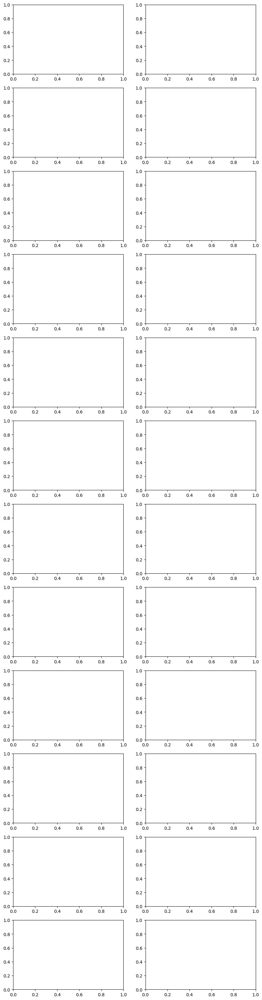

In [19]:
# CELL1

percents  = [0.1, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 20] 
results = []
for p in percents:
    rec, mask, kept, spec, total_local = keep_top_percent(F, p)  # fix: toal -> total_local
    results.append({
        "total": total_local,
        "pct": p,
        "rec": rec,
        "spec": spec,
        "kept": kept,
        "frac_kept": kept / total_local,     # kept/total
        "CR": (total_local / kept),          # Compression Ratio = total/kept
        "MSE": mse(img, rec),                # fix: m -> mse(img, rec)
        "PSNR": psnr(img, rec),
        "SSIM": ssim(img, rec),
    })

# Subset for the side-by-side grid
results_visual = [r for r in results if r["pct"] in percents]

# Arrays for metric plots
pcts  = np.array([r["pct"]  for r in results], dtype=float)
psnrs = np.array([r["PSNR"] for r in results], dtype=float)
ssims = np.array([r["SSIM"] for r in results], dtype=float)
crs   = np.array([r["CR"]   for r in results], dtype=float)

# Ensure output dir exists
outdir = Path("results/dft")
outdir.mkdir(parents=True, exist_ok=True)

rows, cols = len(results_visual), 2
fig, axes = plt.subplots(rows, cols, figsize=(10, 3.4 * rows))
if rows == 1:
    axes = np.array([axes])  # ensure 2D

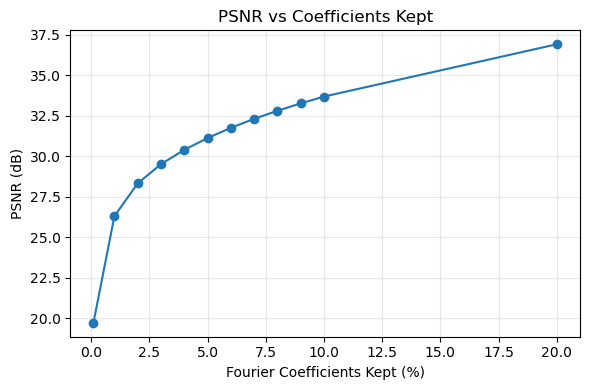

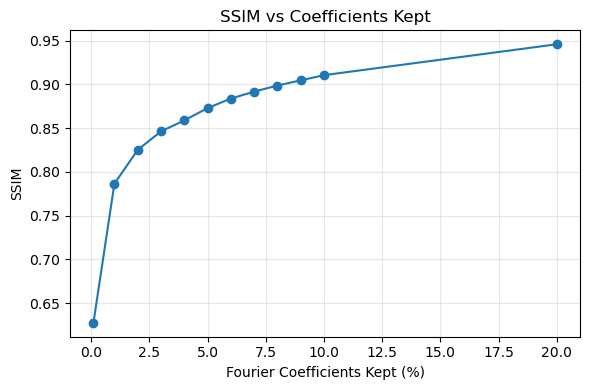

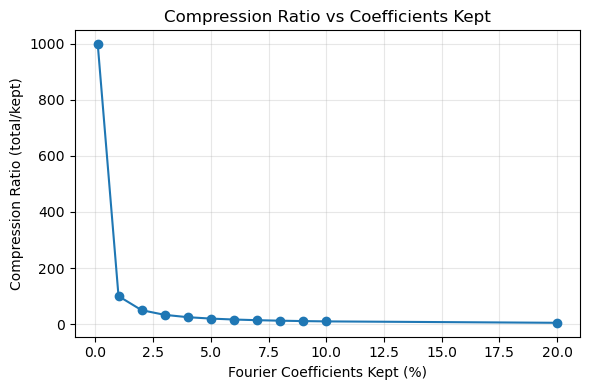

In [20]:
# === PSNR vs % ===
fig_psnr = plt.figure(figsize=(6,4))
plt.plot(pcts, psnrs, marker='o')
plt.xlabel("Fourier Coefficients Kept (%)")
plt.ylabel("PSNR (dB)")
plt.title("PSNR vs Coefficients Kept")
plt.grid(True, alpha=0.3)
plt.tight_layout()
fig_psnr.savefig(outdir / "PSNR.png", dpi=300, bbox_inches="tight")
plt.show()
plt.close(fig_psnr)

# === SSIM vs % ===
fig_ssim = plt.figure(figsize=(6,4))
plt.plot(pcts, ssims, marker='o')
plt.xlabel("Fourier Coefficients Kept (%)")
plt.ylabel("SSIM")
plt.title("SSIM vs Coefficients Kept")
plt.grid(True, alpha=0.3)
plt.tight_layout()
fig_ssim.savefig(outdir / "SSIM.png", dpi=300, bbox_inches="tight")
plt.show()
plt.close(fig_ssim)

# === Compression ratio vs % ===
fig_cr = plt.figure(figsize=(6,4))
plt.plot(pcts, crs, marker='o')
plt.xlabel("Fourier Coefficients Kept (%)")
plt.ylabel("Compression Ratio (total/kept)")
plt.title("Compression Ratio vs Coefficients Kept")
plt.grid(True, alpha=0.3)
plt.tight_layout()
fig_cr.savefig(outdir / "CR.png", dpi=300, bbox_inches="tight")
plt.show()
plt.close(fig_cr)


# PCA

Select a set of grayscale images (e.g., faces, landscapes, or any other category).
Normalize the images by scaling pixel values to a range [0, 1].

## PCA Implementation:
Write a Python function to perform PCA on the images.
Implement the following steps:

1. Convert the image into a 2D matrix where each row represents an image and each column
represents a pixel value

2. Compute the covariance matrix of the image data.

3. Calculate the eigenvalues and eigenvectors of the covariance matrix.

4. Sort the eigenvectors based on the eigenvalues in descending order.


5. Select the top k eigenvectors to form the principal components.

6. Project the original images onto the lower-dimensional subspace defined by the selected principal components.

## Reconstruction of Images:

1. Using the selected principal components, reconstruct the images.

2. Compare the reconstructed images with the original images to observe the effects of
dimensionality reduction.

## Experimentation:

1. Vary the number of principal components (k) and observe the impact on the quality of the
reconstructed images.

2. Plot the variance explained by the principal components and determine the optimal number
of components that balances compression and quality.

## Visual Analysis:

1. Display the original images alongside the reconstructed images for different values of k.

**See Experimentation 1.**

2. Comment on the visual quality of the images and how much information is lost during
compression.

## Error Analysis:

1. Compute the Mean Squared Error (MSE) between the original and reconstructed images.

2. Analyze the trade-off between compression and reconstruction error.

# Image processing

## HOG Features

1. Write a Python script to compute the HOG features of a given image using a library such as
OpenCV or scikit-image. 

In [21]:
# =========================================================
# Section 0: Imports & Config (shared across all sections)
# =========================================================
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt

from skimage import io, color, util, exposure
from skimage.feature import hog
from skimage.transform import resize
from skimage.filters import sobel_h, sobel_v

# --- Config ---
HOG_DIR = Path("img/hog")          # Folder containing your images
TARGET_SIZE = (256, 256)           # Resize target for processing/visualization
orientations = 9                   # HOG bins
ppc = (8, 8)                       # pixels_per_cell
cpb = (2, 2)                       # cells_per_block

# --- IO helpers (shared) ---
def safe_read(path: Path):
    img = io.imread(path)
    if img.ndim == 3 and img.shape[-1] == 4:
        img = color.rgba2rgb(img)
    return util.img_as_float(img)

def to_gray(img):
    if img.ndim == 2:
        return util.img_as_float(img)
    if img.shape[-1] == 4:
        img = color.rgba2rgb(img)
    return color.rgb2gray(util.img_as_float(img))

def resize_gray(img_gray, size=TARGET_SIZE):
    return resize(img_gray, size, anti_aliasing=True, preserve_range=True)

def ensure_dir(p: Path):
    p.mkdir(parents=True, exist_ok=True)


# =========================================================
# Section 1: Compute HOG features of a given image
# (scikit-image implementation)
# =========================================================
def hog_features_and_vis_gray(
    img,
    orientations=orientations,
    pixels_per_cell=ppc,
    cells_per_block=cpb,
):
    """
    Returns:
      feats: 1D HOG feature vector
      hog_vis: HOG visualization image (float in [0,1])
    """
    g = resize_gray(to_gray(img), TARGET_SIZE)
    feats, hog_vis = hog(
        g,
        orientations=orientations,
        pixels_per_cell=pixels_per_cell,
        cells_per_block=cells_per_block,
        visualize=True,
        channel_axis=None,
        block_norm="L2-Hys",
    )
    hog_vis = exposure.rescale_intensity(hog_vis, in_range="image")
    return feats, hog_vis


def gradient_components(img):
    """Return (Gx, Gy) on a resized grayscale image."""
    g = to_gray(img)
    g = resize_gray(g, TARGET_SIZE)
    return sobel_h(g), sobel_v(g)


2. Apply your implementation to at least three different images, including both simple and complex scenes. 

In [22]:
# =========================================================
# Section 2: Apply to at least three images (simple & complex)
# (dynamically gather images from folder)
# =========================================================
valid_exts = {".png", ".jpg", ".jpeg", ".bmp", ".tif", ".tiff", ".webp"}
img_paths = sorted([p for p in HOG_DIR.iterdir() if p.suffix.lower() in valid_exts])

if len(img_paths) < 3:
    raise FileNotFoundError(
        f"Found {len(img_paths)} images in {HOG_DIR.resolve()} — need at least 3. "
        f"Valid extensions: {sorted(valid_exts)}"
    )

imgs = [safe_read(p) for p in img_paths]

# Precompute per-image data (same as before)
rows = []
for img in imgs:
    feats, hog_vis = hog_features_and_vis_gray(img, orientations, ppc, cpb)
    gx, gy = gradient_components(img)
    mag = np.hypot(gx, gy)
    rows.append({
        "img": img,
        "gx": exposure.rescale_intensity(gx,  in_range="image"),
        "gy": exposure.rescale_intensity(gy,  in_range="image"),
        "mag": exposure.rescale_intensity(mag, in_range="image"),
        "hog": hog_vis,
        "feat_len": feats.size
    })

3. Visualize the original image, the gradient image, and the HOG feature image.

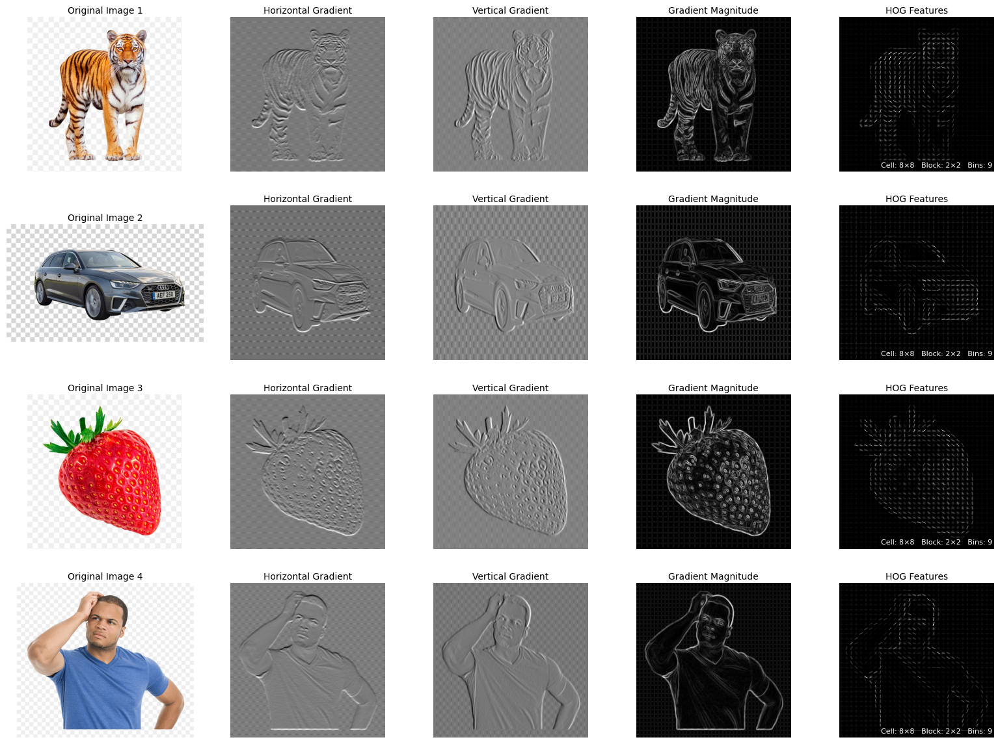

In [23]:
# =========================================================
# Section 3: Visualize original, gradient, and HOG feature image
# (reproduces the same 5-column grid and file output)
# =========================================================
n = len(rows)
fig, axes = plt.subplots(n, 5, figsize=(20, 3.6 * n), constrained_layout=False)
if n == 1:
    axes = np.array([axes])  # ensure 2D indexing
plt.subplots_adjust(wspace=0.03, hspace=0.22)

# Fill rows
for i, row in enumerate(rows, start=1):
    # Col 0: Original
    ax0 = axes[i-1, 0]
    ax0.imshow(row["img"], cmap="gray" if row["img"].ndim == 2 else None)
    ax0.set_title(f"Original Image {i}", pad=4, fontsize=10)
    ax0.axis("off")

    # Col 1: Horizontal Gradient (Gx)
    ax1 = axes[i-1, 1]
    ax1.imshow(row["gx"], cmap="gray")
    ax1.set_title("Horizontal Gradient", pad=4, fontsize=10)
    ax1.axis("off")

    # Col 2: Vertical Gradient (Gy)
    ax2 = axes[i-1, 2]
    ax2.imshow(row["gy"], cmap="gray")
    ax2.set_title("Vertical Gradient", pad=4, fontsize=10)
    ax2.axis("off")

    # Col 3: Gradient Magnitude (|∇I|)
    ax3 = axes[i-1, 3]
    ax3.imshow(row["mag"], cmap="gray")
    ax3.set_title("Gradient Magnitude", pad=4, fontsize=10)
    ax3.axis("off")

    # Col 4: HOG (short title + settings overlay)
    ax4 = axes[i-1, 4]
    ax4.imshow(row["hog"], cmap="gray")
    ax4.set_title("HOG Features", pad=4, fontsize=10)
    ax4.axis("off")
    overlay = f"Cell: {ppc[0]}×{ppc[1]}   Block: {cpb[0]}×{cpb[1]}   Bins: {orientations}"
    ax4.text(
        0.99, 0.02, overlay,
        transform=ax4.transAxes, ha="right", va="bottom",
        fontsize=8, color="white",
        bbox=dict(facecolor="black", alpha=0.55, pad=2, edgecolor="none"),
    )

# Save (identical output path/name)
out_dir = Path("results/hog")
ensure_dir(out_dir)
plt.savefig(out_dir / "hog_features.png", dpi=300, bbox_inches="tight")
plt.show()

4. Compare the HOG features extracted from different images. Discuss the impact of varying
parameters like cell size, block size, and the number of bins on the resulting HOG
descriptors.

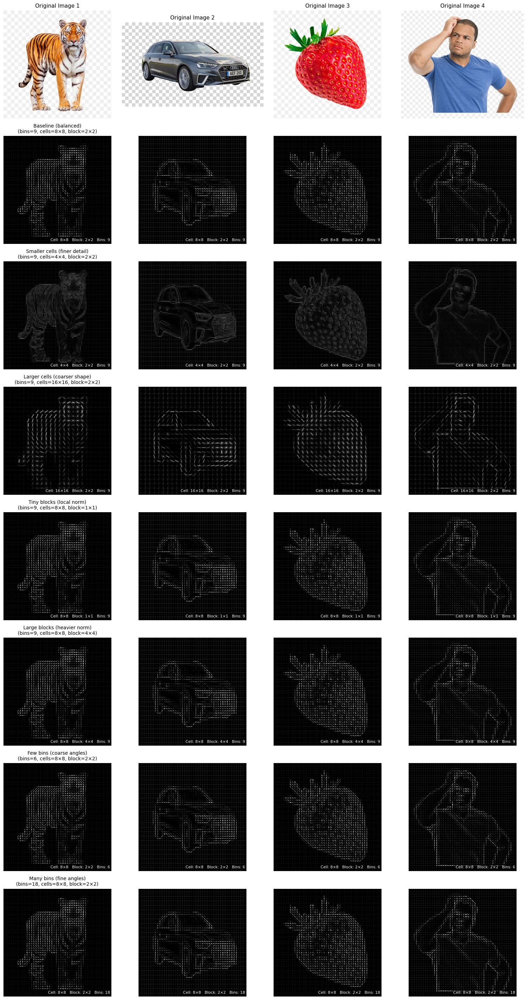

In [24]:
# ===== HOG grid: dynamic folder loading + per-config rows + in-panel settings overlay =====

# --- Config ---
HOG_DIR = Path("img/hog")          # folder with images
TARGET_SIZE = (384, 384)           # larger canvas so coarse cells still show clearly
VIS_GAIN = 2.2                     # boost HOG vis contrast (2.0–3.0 works well)

# --- Parameter grid (rows under originals) ---
param_grid = [
    {"label": "Baseline (balanced)", "desc": "bins=9, cells=8×8, block=2×2",  "O": 9,  "ppc": (8,8),   "cpb": (2,2)},
    # Vary cell size (detail vs. noise)
    {"label": "Smaller cells (finer detail)", "desc": "bins=9, cells=4×4, block=2×2", "O": 9, "ppc": (4,4),  "cpb": (2,2)},
    {"label": "Larger cells (coarser shape)", "desc": "bins=9, cells=16×16, block=2×2", "O": 9, "ppc": (16,16), "cpb": (2,2)},
    # Vary block size (normalization footprint)
    {"label": "Tiny blocks (local norm)", "desc": "bins=9, cells=8×8, block=1×1", "O": 9, "ppc": (8,8),  "cpb": (1,1)},
    {"label": "Large blocks (heavier norm)", "desc": "bins=9, cells=8×8, block=4×4", "O": 9, "ppc": (8,8), "cpb": (4,4)},
    # Vary orientation bins (angular resolution)
    {"label": "Few bins (coarse angles)", "desc": "bins=6, cells=8×8, block=2×2", "O": 6, "ppc": (8,8),  "cpb": (2,2)},
    {"label": "Many bins (fine angles)",  "desc": "bins=18, cells=8×8, block=2×2","O": 18,"ppc": (8,8), "cpb": (2,2)},
]

# --- IO helpers ---
def safe_read(path: Path):
    im = io.imread(path)
    if im.ndim == 3 and im.shape[-1] == 4:
        im = color.rgba2rgb(im)
    return util.img_as_float(im)


def to_gray_resized(im, size=TARGET_SIZE):
    if im.ndim == 2:
        g = util.img_as_float(im)
    else:
        if im.shape[-1] == 4:
            im = color.rgba2rgb(im)
        g = color.rgb2gray(util.img_as_float(im))
    return resize(g, size, anti_aliasing=True, preserve_range=True)


def hog_feats_vis_gray(im, orientations, ppc, cpb):
    g = to_gray_resized(im, TARGET_SIZE)
    feats, vis = hog(
        g,
        orientations=orientations,
        pixels_per_cell=ppc,
        cells_per_block=cpb,
        visualize=True,
        channel_axis=None,
        block_norm="L2-Hys",
    )
    # boost contrast to make differences obvious
    vis = exposure.rescale_intensity(vis, in_range="image")
    vis = np.clip(vis * VIS_GAIN, 0, 1)
    return feats, vis

# --- Gather images dynamically from folder ---
valid_exts = {".png", ".jpg", ".jpeg", ".bmp", ".tif", ".tiff", ".webp"}
img_paths = sorted([p for p in HOG_DIR.iterdir() if p.suffix.lower() in valid_exts])
if not img_paths:
    raise FileNotFoundError(f"No images found in {HOG_DIR.resolve()} with extensions {sorted(valid_exts)}")

images = [(p.stem, safe_read(p)) for p in img_paths]
n_images = len(images)

# --- Figure: Row 0 originals, then one row per HOG config ---
n_rows = 1 + len(param_grid)
n_cols = n_images

fig, axes = plt.subplots(n_rows, n_cols, figsize=(4*n_cols, 3.6*n_rows), constrained_layout=False)
if n_rows == 1: axes = np.expand_dims(axes, axis=0)
if n_cols == 1: axes = np.expand_dims(axes, axis=1)

# Layout tweaks
plt.subplots_adjust(wspace=0.05, hspace=0.22)

# Row 0: originals (title EXACTLY "Original Image {i}")
for c, (_name, im) in enumerate(images, start=1):
    ax = axes[0, c-1]
    ax.imshow(im, cmap="gray" if im.ndim == 2 else None)
    ax.set_title(f"Original Image {c}", fontsize=11, pad=6)
    ax.axis("off")


# Subsequent rows: HOG per config
for r, cfg in enumerate(param_grid, start=1):
    for c, (name, im) in enumerate(images):
        _, vis = hog_feats_vis_gray(im, cfg["O"], cfg["ppc"], cfg["cpb"])
        ax = axes[r, c]
        ax.imshow(vis, cmap="gray")
        # Only the first column gets a row label to avoid clutter (no feature length in titles)
        if c == 0:
            ax.set_title(f"{cfg['label']}\n({cfg['desc']})", fontsize=10, pad=6)
        ax.axis("off")
        # In-panel settings overlay at bottom-right
        overlay = f"Cell: {cfg['ppc'][0]}×{cfg['ppc'][1]}   Block: {cfg['cpb'][0]}×{cfg['cpb'][1]}   Bins: {cfg['O']}"
        ax.text(
            0.99, 0.02, overlay,
            transform=ax.transAxes, ha="right", va="bottom",
            fontsize=8, color="white",
            bbox=dict(facecolor="black", alpha=0.58, pad=2, edgecolor="none"),
        )
plt.tight_layout()
plt.savefig("results/hog/hog_features_grid.png", dpi=300, bbox_inches="tight")
plt.show()

## Local Binary Patterns (LBP)

1. Write a Python function to compute the LBP of a given grayscale image. Use the basic 8-
neighbor LBP method.

In [25]:
def lbp_basic_8(gray: np.ndarray, strict: bool = False) -> np.ndarray:
    if gray.ndim != 2:
        raise ValueError("Forventet 2D gråtonebilde")
    g = gray.astype(np.float32, copy=False)
    H, W = g.shape
    out = np.zeros((H, W), dtype=np.uint8)
    C = g[1:-1, 1:-1]
    cmp = (lambda A, B: A > B) if strict else (lambda A, B: A >= B)

    # skimage-order: R, TR, T, TL, L, BL, B, BR
    out[1:-1, 1:-1] = (
        (cmp(g[1:-1, 2:  ], C).astype(np.uint8) << 0) |  # R
        (cmp(g[0:-2, 2:  ], C).astype(np.uint8) << 1) |  # TR
        (cmp(g[0:-2, 1:-1], C).astype(np.uint8) << 2) |  # T
        (cmp(g[0:-2, 0:-2], C).astype(np.uint8) << 3) |  # TL
        (cmp(g[1:-1, 0:-2], C).astype(np.uint8) << 4) |  # L
        (cmp(g[2:  , 0:-2], C).astype(np.uint8) << 5) |  # BL
        (cmp(g[2:  , 1:-1], C).astype(np.uint8) << 6) |  # B
        (cmp(g[2:  , 2:  ], C).astype(np.uint8) << 7)    # BR
    )
    return out

2. Your function should output the LBP image, where each pixel is replaced by its
corresponding LBP value.

Image size: 490 x 612 = 299880 pixels


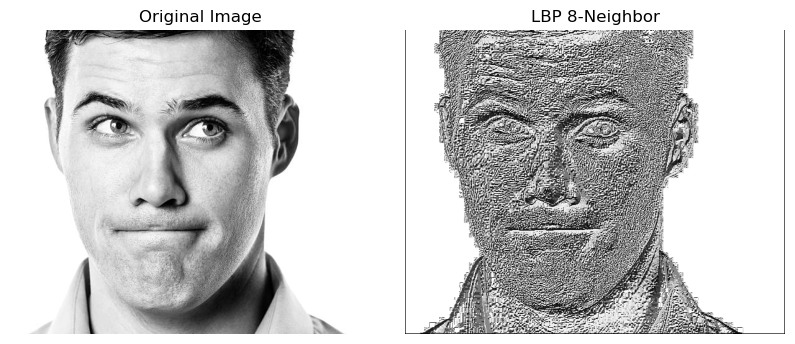

In [27]:
def imread_grayscale(path):
    return np.asarray(Image.open(path).convert("L"), dtype=np.float32) / 255.0

# --- Kjøring/visning ---
image_path = "img/lbp/img1.jpg"
img = imread_grayscale(image_path)
lbp_img = lbp_basic_8(img)

# print # pixel of img
print(f"Image size: {img.shape[0]} x {img.shape[1]} = {img.size} pixels")

plt.figure(figsize=(12,4))

plt.subplot(1,3,1)
plt.title("Original Image")
plt.imshow(img, cmap="gray")
plt.axis("off")

plt.subplot(1,3,2)
plt.title("LBP 8-Neighbor")
plt.imshow(lbp_img, cmap="gray")
plt.axis("off")

plt.tight_layout()
plt.savefig("results/lbp/lbp.png", dpi=300, bbox_inches="tight")
plt.show()

3. Write a Python function to compute the histogram of the LBP image.

In [29]:
def lbp_histogram(lbp_image, exclude_border=True):
    # Optional: drop the zero-valued 1px border introduced by the LBP window
    if exclude_border:
        lbp_image = lbp_image[1:-1, 1:-1]

    # Count occurrences of each LBP code 0..255 (NOT normalized)
    counts, _ = np.histogram(lbp_image, bins=256, range=(0, 256), density=False)
    return counts

4. Plot the histogram and explain what it represents in terms of the texture features of the
image.

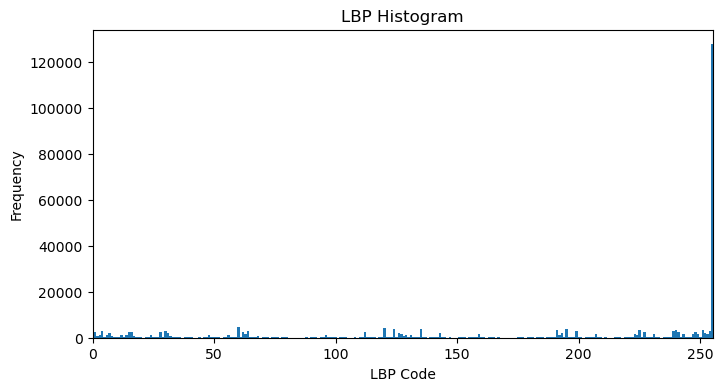

In [31]:
hist = lbp_histogram(lbp_img)
plt.figure(figsize=(8,4))
plt.title("LBP Histogram")
plt.bar(np.arange(256), hist, width=1.0)
plt.xlim([0, 255])
plt.xlabel("LBP Code")
plt.ylabel("Frequency")
plt.savefig("results/lbp/lbp_histogram.png", dpi=300, bbox_inches="tight")
plt.show()

5. Apply your LBP function to at least three different grayscale images (e.g., a natural scene, a
texture, and a face image).

6. Generate and compare the histograms of the LBP images.

7. Discuss the differences in the histograms and what they tell you about the textures of the
different images.

## Implement a blob detection algorithm

1. Apply the blob detection algorithm to one of the provided image datasets on blackboard.

In [ ]:
# Folder path
folder_path = "img/blob"

# Get all image filenames (JPG/PNG)
image_files = sorted(
    [f for f in os.listdir(folder_path) if f.lower().endswith((".jpg", ".png"))]
)

# Apply blob detection on all images
blob_results = {}  # store blobs for each image

for filename in image_files:
    image_path = os.path.join(folder_path, filename)

    # --- Read and convert to grayscale ---
    image_rgb = io.imread(image_path)
    image_gray = color.rgb2gray(image_rgb)

    # --- Blob detection (same logic as before) ---
    blobs_log = feature.blob_log(image_gray, max_sigma=30, num_sigma=10, threshold=0.1)
    blobs_log[:, 2] = blobs_log[:, 2] * (2 ** 0.5)

    # Store results
    blob_results[filename] = {
        "rgb": image_rgb,
        "gray": image_gray,
        "blobs": blobs_log
    }

2. Visualize the detected blobs on the original images, marking each detected blob with a
circle or bounding box.

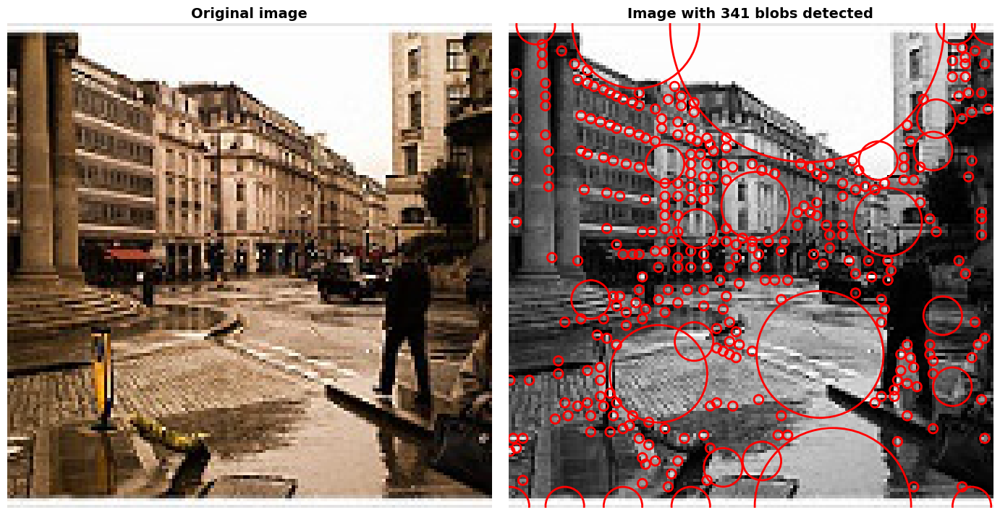

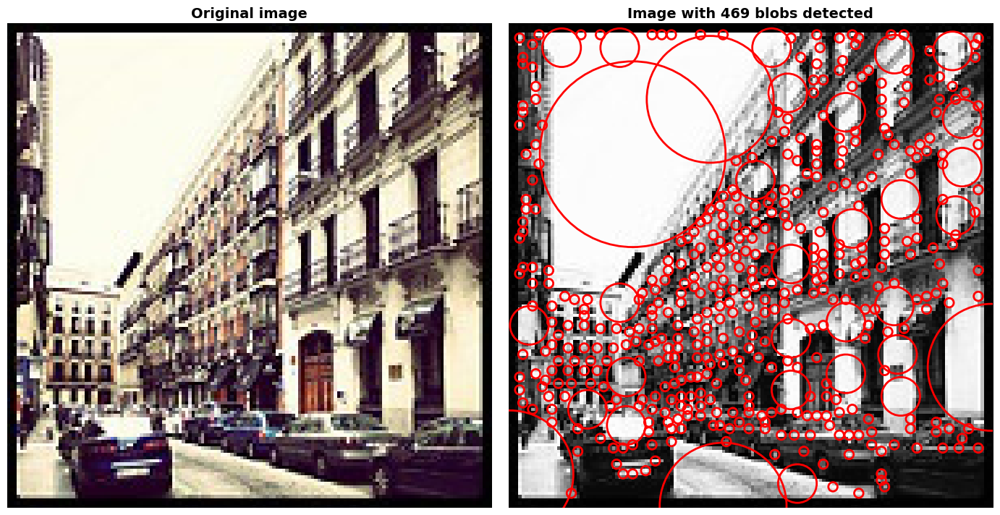

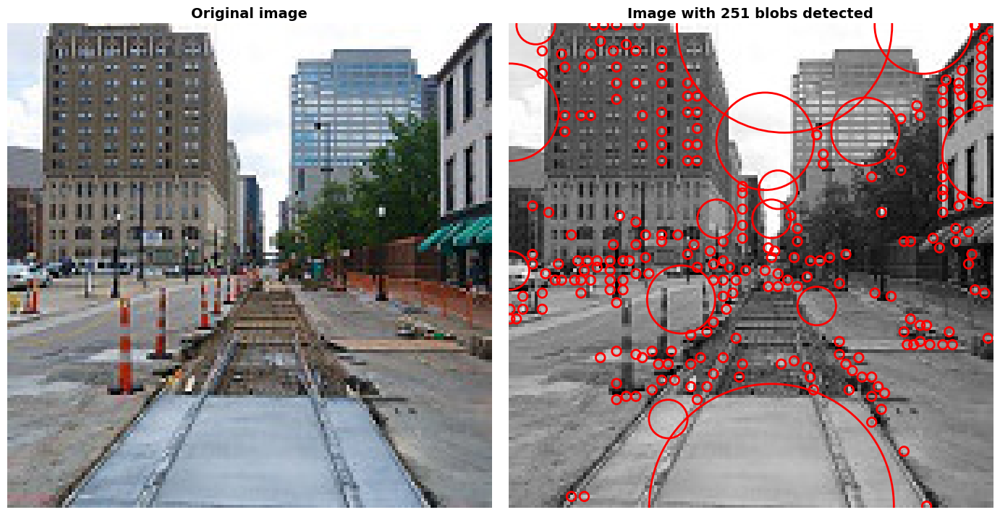

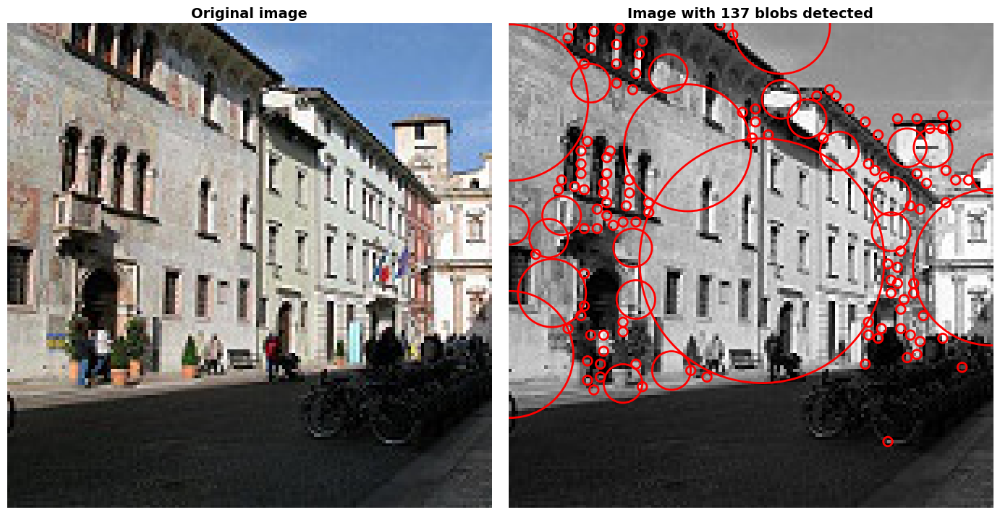

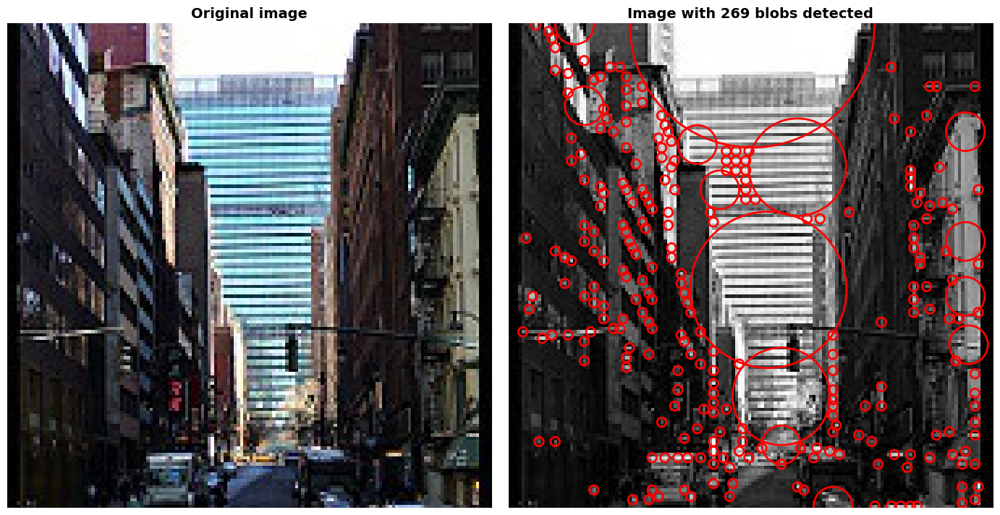

In [ ]:
# Visualize blobs for each image
for filename, data in blob_results.items():
    image_rgb = data["rgb"]
    image_gray = data["gray"]
    blobs_log = data["blobs"]

    # --- Visualization: side-by-side ---
    fig, axes = plt.subplots(1, 2, figsize=(14, 7))
    ax1, ax2 = axes

    # Left: original RGB
    ax1.imshow(image_rgb)
    ax1.set_title("Original image", fontsize=14, fontweight="bold")
    ax1.axis("off")

    # Right: grayscale with detected blobs
    ax2.imshow(image_gray, cmap='gray')
    for y, x, r in blobs_log:
        c = plt.Circle((x, y), r, color='red', linewidth=2, fill=False)
        ax2.add_patch(c)
    ax2.set_title(f"Image with {len(blobs_log)} blobs detected", fontsize=14, fontweight="bold")
    ax2.axis("off")

    plt.tight_layout()
    plt.show()

3. Calculate and display relevant statistics for each image, such as the number of blobs
detected, their sizes, and positions.

Per-blob table created with 1467 blobs across 5 images.



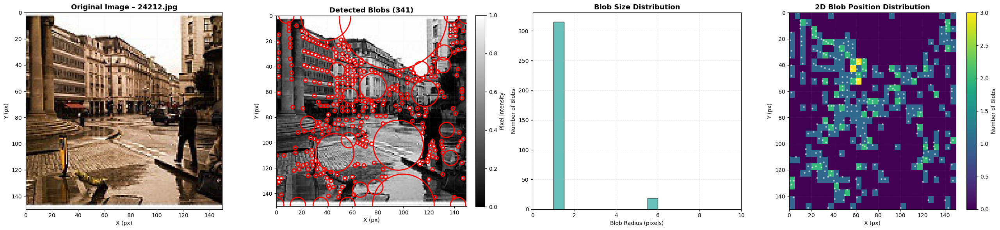

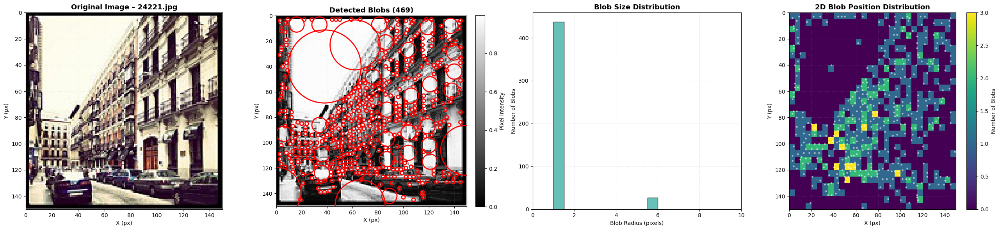

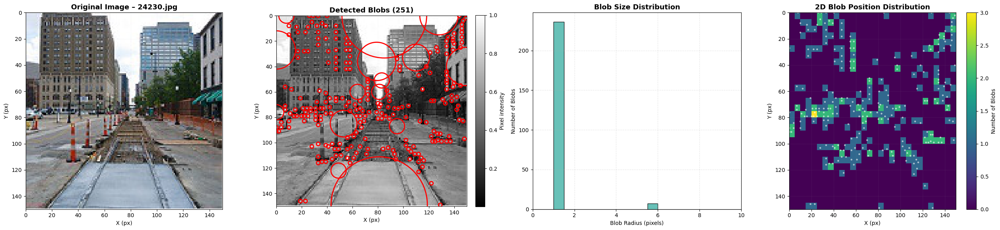

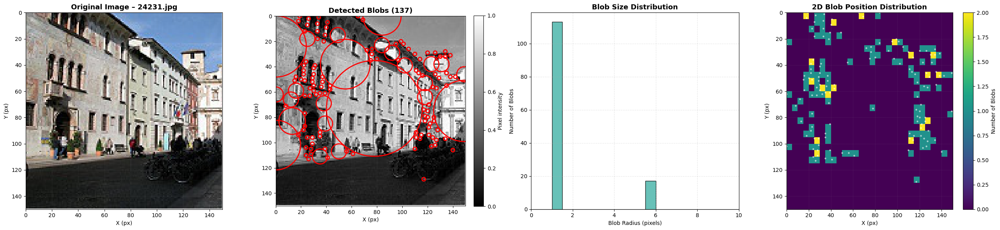

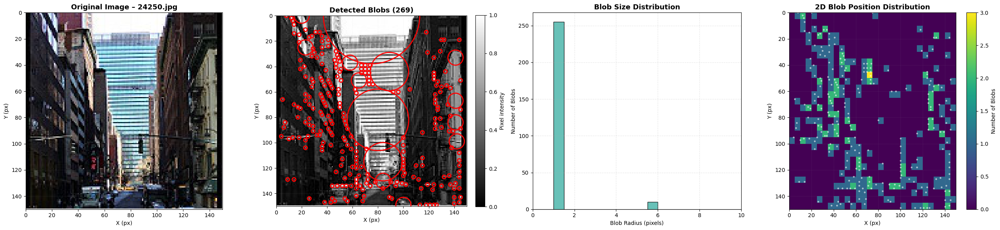

In [ ]:
# If per_blob_df is already built, you can skip rebuilding it. Keeping here for completeness.
rows = []
for filename, d in blob_results.items():
    blobs = d["blobs"]
    if blobs.size == 0:
        continue
    for (y, x, r) in blobs:
        rows.append({
            "image": filename,
            "y_px": float(y),
            "x_px": float(x),
            "radius_px": float(r),
            "area_px2": float(pi * r * r),
        })
per_blob_df = pd.DataFrame(rows, columns=["image", "y_px", "x_px", "radius_px", "area_px2"])
print(f"Per-blob table created with {len(per_blob_df)} blobs across {per_blob_df['image'].nunique()} images.\n")

for image_name, group in per_blob_df.groupby("image"):
    # Retrieve image and blobs from blob_results
    image_rgb = blob_results[image_name]["rgb"]
    image_gray = blob_results[image_name]["gray"]
    blobs = blob_results[image_name]["blobs"]

    H, W = image_gray.shape[:2]

    # Setup figure with 4 subplots in a row
    fig, axes = plt.subplots(1, 4, figsize=(26, 6))
    ax_img, ax_blobs, ax_hist, ax_heat = axes

    # ---------- (1) Original image with pixel axes ----------
    ax_img.imshow(image_rgb, interpolation="nearest")
    ax_img.set_title(f"Original Image – {image_name}", fontsize=13, fontweight="bold")
    ax_img.set_xlabel("X (px)")
    ax_img.set_ylabel("Y (px)")
    ax_img.set_xlim(0, W)
    ax_img.set_ylim(H, 0)  # y increases downward to match image coords
    ax_img.grid(alpha=0.2, linestyle=":")

    # ---------- (2) Grayscale with detected blobs + colorbar ----------
    im = ax_blobs.imshow(image_gray, cmap="gray", interpolation="nearest")
    for y, x, r in blobs:
        c = plt.Circle((x, y), r, color="red", linewidth=2, fill=False)
        ax_blobs.add_patch(c)
    ax_blobs.set_title(f"Detected Blobs ({len(blobs)})", fontsize=13, fontweight="bold")
    ax_blobs.set_xlabel("X (px)")
    ax_blobs.set_ylabel("Y (px)")
    ax_blobs.set_xlim(0, W)
    ax_blobs.set_ylim(H, 0)
    ax_blobs.grid(alpha=0.2, linestyle=":")
    # colorbar for grayscale pixel values
    cb = fig.colorbar(im, ax=ax_blobs, fraction=0.046, pad=0.04)
    cb.set_label("Pixel intensity")

    # ---------- (3) Histogram of blob sizes ----------
    max_radius = group["radius_px"].max() if not group.empty else 10
    bins = np.arange(0, max(10, max_radius) + 0.5, 0.5)
    ax_hist.hist(group["radius_px"], bins=bins, color="#4DB6AC", edgecolor="black", alpha=0.85)
    ax_hist.set_title("Blob Size Distribution", fontsize=13, fontweight="bold")
    ax_hist.set_xlabel("Blob Radius (pixels)")
    ax_hist.set_ylabel("Number of Blobs")
    ax_hist.set_xlim(0, 10)
    ax_hist.grid(alpha=0.3, linestyle="--")

    # ---------- (4) 2D heatmap of blob positions (match image coords) ----------
    # Invert y-axis so that (0,0) is top-left like the images
    h = ax_heat.hist2d(group["x_px"], group["y_px"], bins=30, range=[[0, W], [0, H]], cmap="viridis")
    fig.colorbar(h[3], ax=ax_heat, label="Number of Blobs")
    # overlay blob centers for direct comparison
    ax_heat.scatter(group["x_px"], group["y_px"], s=10, c="white", alpha=0.6, linewidths=0.0)
    ax_heat.set_title("2D Blob Position Distribution", fontsize=13, fontweight="bold")
    ax_heat.set_xlabel("X (px)")
    ax_heat.set_ylabel("Y (px)")
    ax_heat.set_xlim(0, W)
    ax_heat.set_ylim(H, 0)  # invert Y to match image coordinates
    ax_heat.grid(alpha=0.2, linestyle=":")

    plt.tight_layout()
    plt.show()

4. Evaluate and discuss the effect of different parameters in the algorithms on the detection of
different blobs.

## Implement a contour detection algorithm.

1. Apply the contour detection algorithm to the same image dataset.

In [ ]:
# CELL 1 — Apply contour detection (no visualization)

import os
import numpy as np
from skimage import io, color, filters, measure, morphology

# Folder path 
folder_path = "img/blob"

# Collect images
image_files = sorted(
    [f for f in os.listdir(folder_path) if f.lower().endswith((".jpg", ".png"))]
)


# Run contour detection and store results
contour_results = {}  # filename -> dict with rgb, gray, binary, contours

for filename in image_files:
    image_path = os.path.join(folder_path, filename)

    # --- Read images ---
    image_rgb = io.imread(image_path)
    image_gray = color.rgb2gray(image_rgb)

    # --- Threshold to binary (Otsu method) ---
    thresh = filters.threshold_otsu(image_gray)
    binary = image_gray > thresh  # flip sign if objects are darker
    binary = morphology.remove_small_objects(binary, min_size=64)

    # --- Find contours ---
    contours = measure.find_contours(binary, level=0.5)

    contour_results[filename] = {
        "rgb": image_rgb,
        "gray": image_gray,
        "binary": binary,
        "contours": contours,
        "thresh": thresh,
    }

2. Visualize the detected contours on the original images, marking each contour with a
different color.

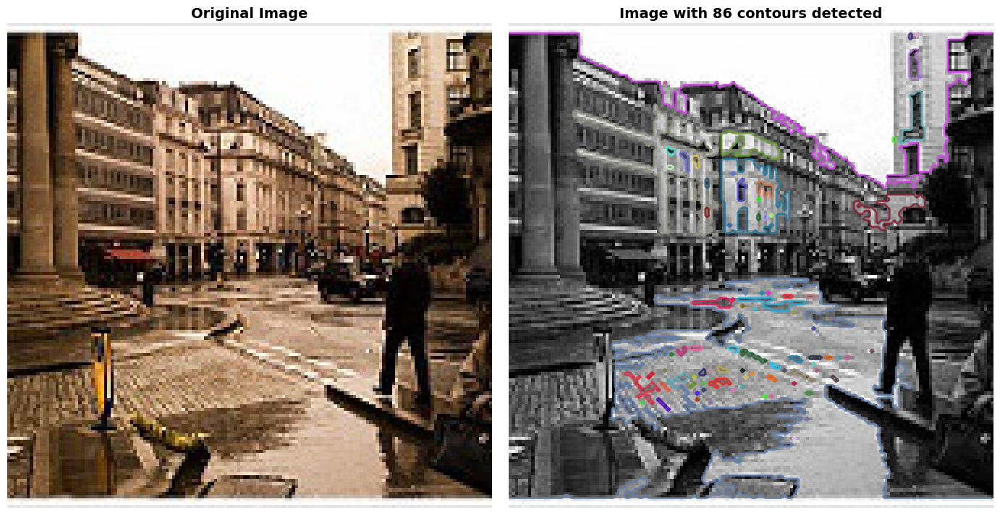

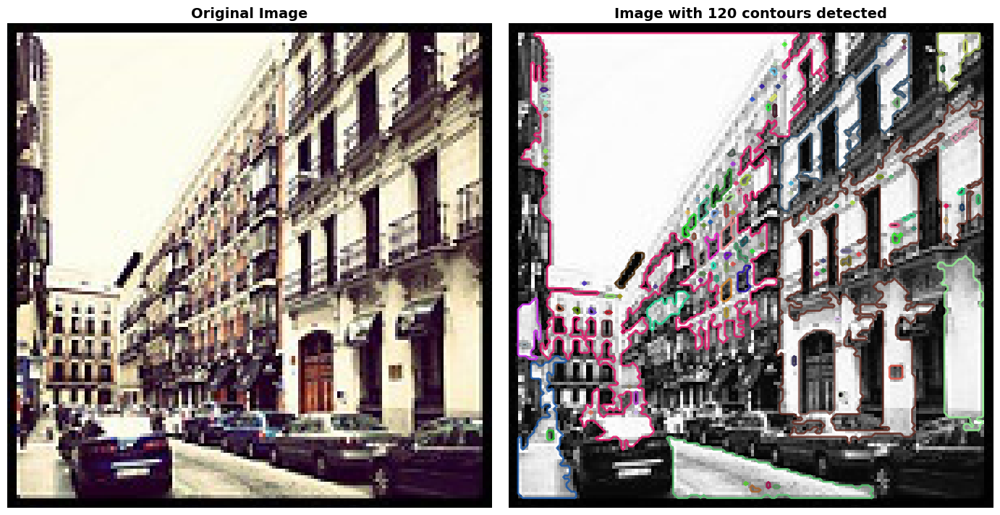

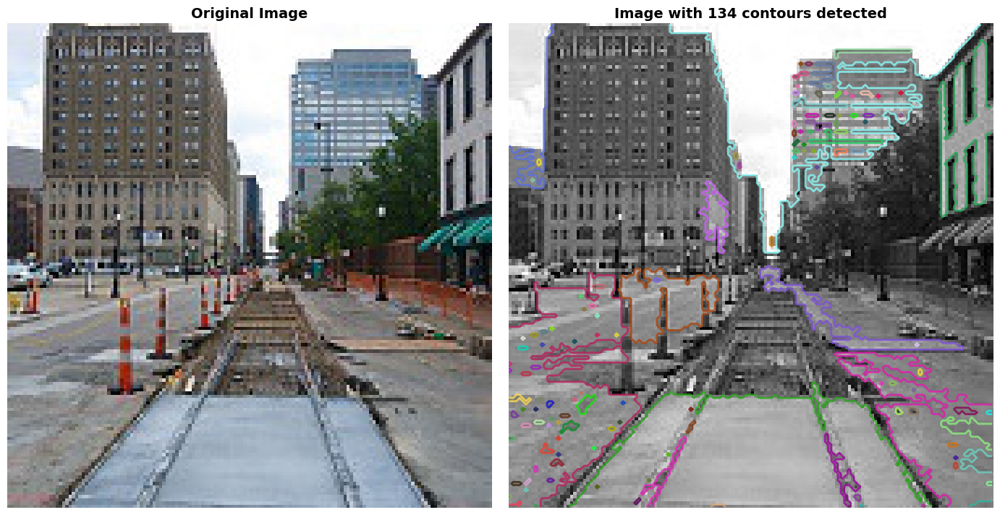

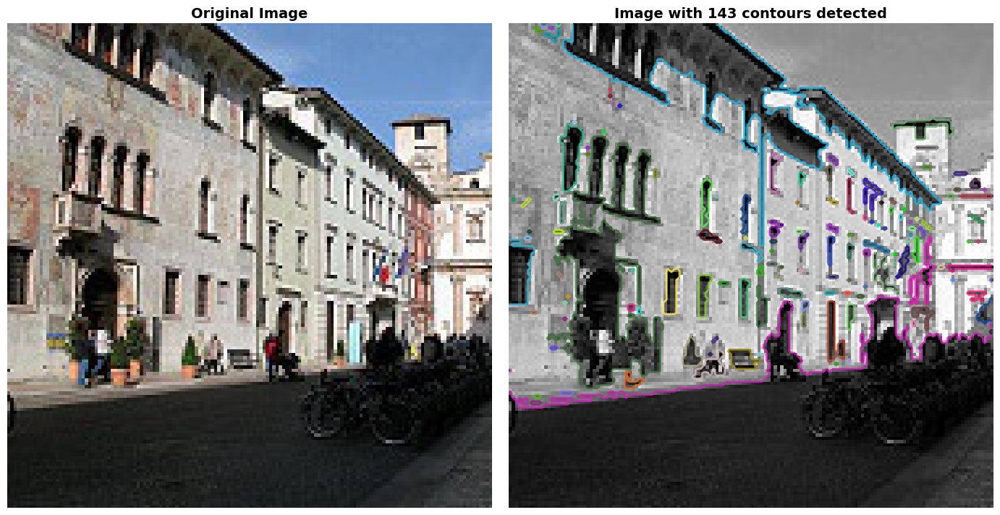

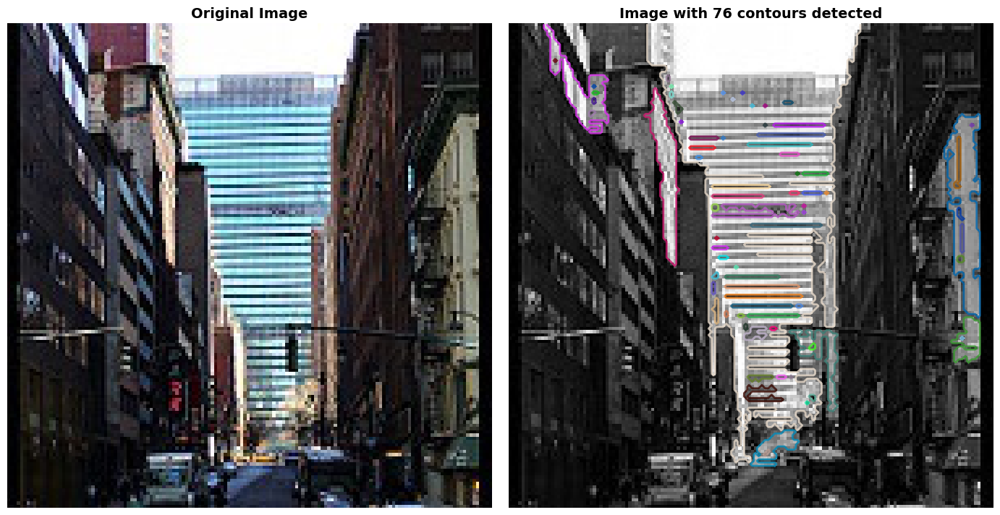

In [ ]:
# CELL 2 — Visualize contours with different colors (side-by-side with original)

import numpy as np
import matplotlib.pyplot as plt

# Uses: contour_results (from Cell 1), SAVE, out_dir

for filename, data in contour_results.items():
    image_rgb = data["rgb"]
    image_gray = data["gray"]
    contours = data["contours"]

    # --- Visualize side-by-side ---
    fig, axes = plt.subplots(1, 2, figsize=(14, 7))
    ax1, ax2 = axes

    # Left: original RGB
    ax1.imshow(image_rgb)
    ax1.set_title("Original Image", fontsize=14, fontweight="bold")
    ax1.axis("off")

    # Right: grayscale with colored contours
    ax2.imshow(image_gray, cmap="gray")
    for contour in contours:
        color_random = np.random.rand(3,)  # different color for each contour
        ax2.plot(contour[:, 1], contour[:, 0], linewidth=2, alpha=0.8, color=color_random)
    ax2.set_title(f"Image with {len(contours)} contours detected", fontsize=14, fontweight="bold")
    ax2.axis("off")

    plt.tight_layout()
    plt.show()

3. Calculate and display relevant statistics for each image, such as the number of contours
detected, contour area, and perimeter.

4. Compare the results of blob detection and contour detection for the chosen dataset.

5. Discuss the advantages and limitations of each technique.





6. Analyze the impact of different parameters (e.g., threshold values, filter sizes) on the
detection results.

7. Provide examples where one technique might be more suitable than the other.